In [1]:
import torch
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [2]:
import pickle

def pkl_save(path, obj):
  with open(path, 'wb') as file:
    pickle.dump(obj, file)

def pkl_load(path):
  with open(path, 'rb') as file:
    return pickle.load(file)

In [3]:
US_VOCAB = ['Alabama','Alaska','Arizona','Arkansas','California','Colorado','Connecticut','Delaware','Florida','Georgia','Hawaii','Idaho','Illinois','Indiana','Iowa','Kansas','Kentucky','Louisiana','Maine','Maryland','Massachusetts','Michigan','Minnesota','Mississippi','Missouri','Montana','Nebraska','Nevada','New Hampshire','New Jersey','New Mexico','New York','North Carolina','North Dakota','Ohio','Oklahoma','Oregon','Pennsylvania','Rhode Island','South Carolina','South Dakota','Tennessee','Texas','Utah','Vermont','Virginia','Washington','West Virginia','Wisconsin','Wyoming']

In [4]:
data = pd.read_csv("data.csv", index_col=0).rename(columns={'country_name': 'Country'})
rename = {
    "Macedonia, the Former Yugoslav Republic of": "Macedonia"
}
data.Country = data.Country.map(lambda c: rename.get(c,c))

In [5]:
logits = pkl_load('logits_us')
probs = torch.softmax(logits, 1)
pdf = pd.DataFrame(probs.numpy())
pdf.columns = US_VOCAB
pdf.index=data.Country

In [6]:
country_to_state = pdf.groupby(pdf.index).mean()

In [7]:
def most_similar(state, num=10):
    return country_to_state[[state]].sort_values(by=state, ascending=False)[:num]

In [8]:
most_similar("Alaska", 3)

,Alaska
Country,
Finland,0.386651
Norway,0.292027
Sweden,0.160602


In [9]:
most_similar("California", 10)

,California
Country,
Tunisia,0.420530
Israel,0.380296
Jordan,0.266079
Senegal,0.229052
Chile,0.213232
Kyrgyzstan,0.201886
Australia,0.190805
United Arab Emirates,0.186447
Spain,0.180057


In [10]:
most_similar("Hawaii", 10)

,Hawaii
Country,
American Samoa,0.529627
Uganda,0.473824
South Africa,0.361101
Sri Lanka,0.282420
Brazil,0.280703
Philippines,0.258527
Cambodia,0.256999
Portugal,0.240035
Ireland,0.225214


In [11]:
most_similar("Pennsylvania")

,Pennsylvania
Country,
Czech Republic,0.261383
Poland,0.249810
Slovakia,0.240427
Austria,0.226952
Serbia,0.222104
Germany,0.220226
Hungary,0.216061
Belgium,0.215249
Macedonia,0.212658


In [12]:
most_similar("Texas", 1)

,Texas
Country,
Botswana,0.280536


In [13]:
most_similar("West Virginia", 7)

,West Virginia
Country,
Bhutan,0.323994
Slovenia,0.288010
Croatia,0.237059
Albania,0.229530
Serbia,0.207481
Faroe Islands,0.201504
Macedonia,0.198644


In [14]:
most_similar('Washington', 3)

,Washington
Country,
Iceland,0.232475
Greenland,0.183731
Germany,0.139840


In [15]:
most_similar('Oregon', 5)

,Oregon
Country,
Iceland,0.206781
Japan,0.143714
United Kingdom,0.132393
Switzerland,0.131952
New Zealand,0.130602


In [16]:
# Find some images for state -> country

In [17]:
pdf.index=data.index

In [18]:
def get_similar(country, state):
    return pdf[(data.Country==country).tolist()][state].sort_values(ascending=False)

In [45]:
def show_similar(country, state, num=4):
    similar = get_similar(country, state)
    files = similar.index
    confidences = similar.values
    fig, axes = plt.subplots(1, num, figsize=(20,6))
    fig.subplots_adjust(wspace=0.02,hspace=0.02)
    for file, confidence, ax in zip(files, confidences, axes):
        im = Image.open(next(Path('data').glob(f'*/*{file}.jpg')))
        ax.imshow(im)
        ax.set_xlabel(f"Confidence: {100*confidence:.2f}%", fontsize=22)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
    fig.suptitle(f"Scenes in {country} That Resemble {state}", y=0.89, fontsize=28)
    plt.show()
    plt.pause(0.001)

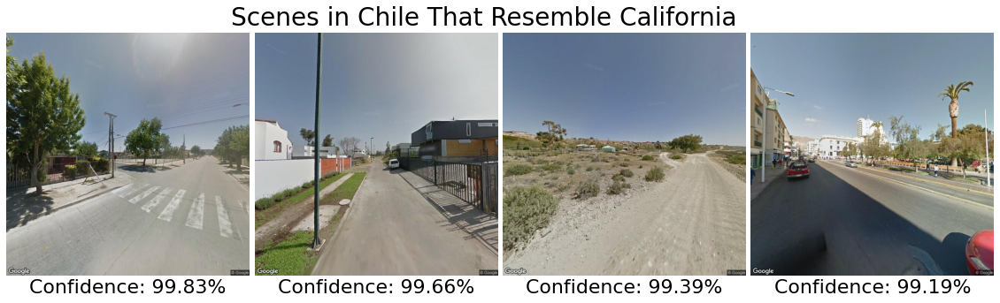

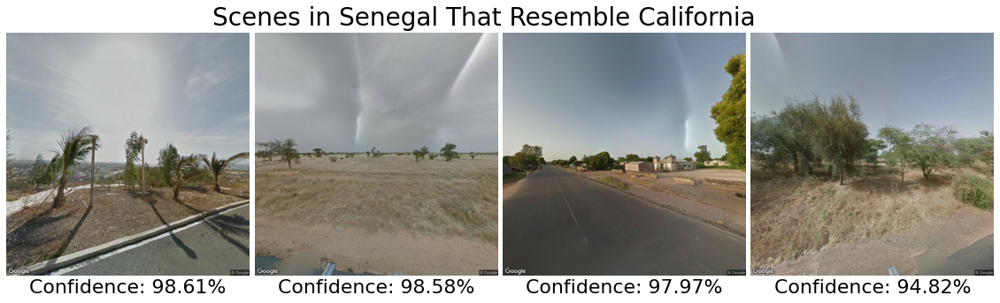

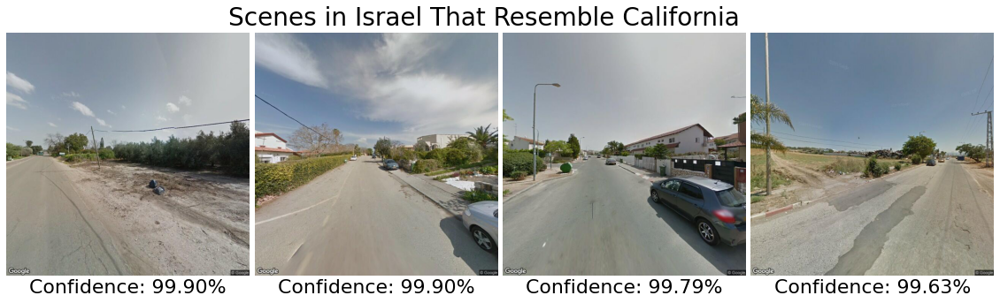

In [46]:
show_similar('Chile', 'California')
show_similar('Senegal', 'California')
show_similar('Israel', 'California')

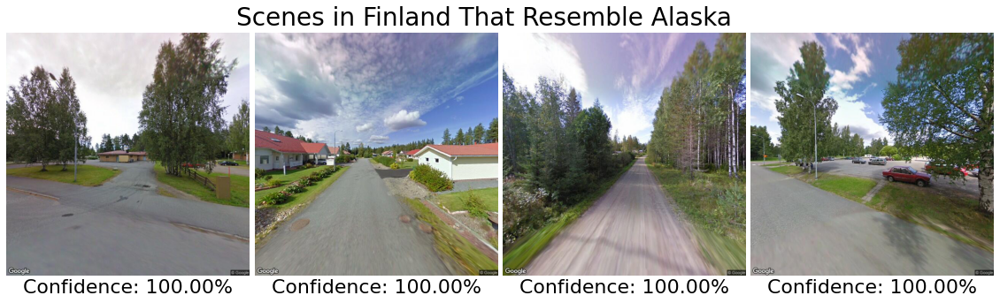

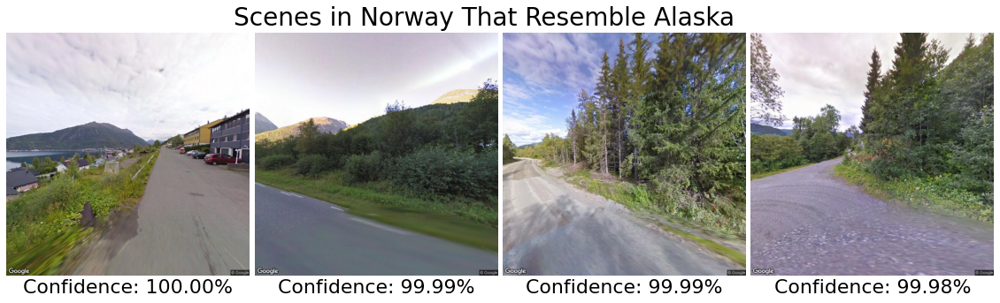

In [47]:
show_similar('Finland', 'Alaska')
show_similar('Norway', 'Alaska')

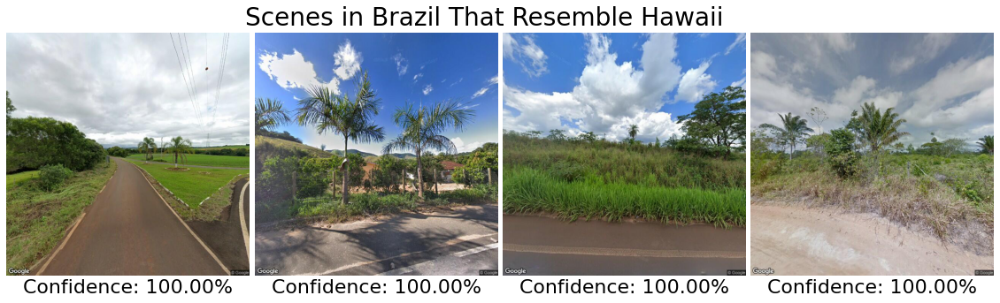

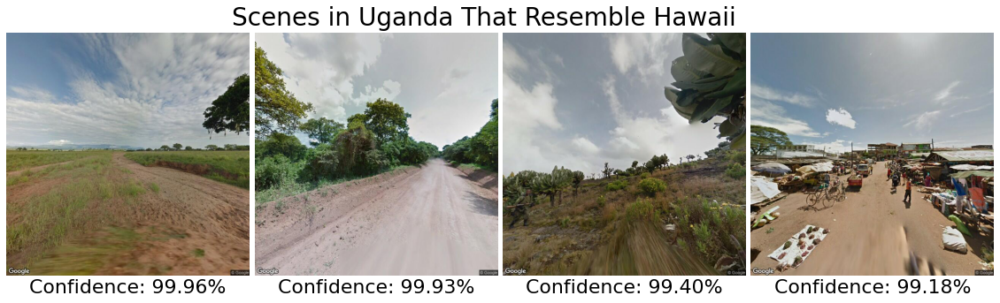

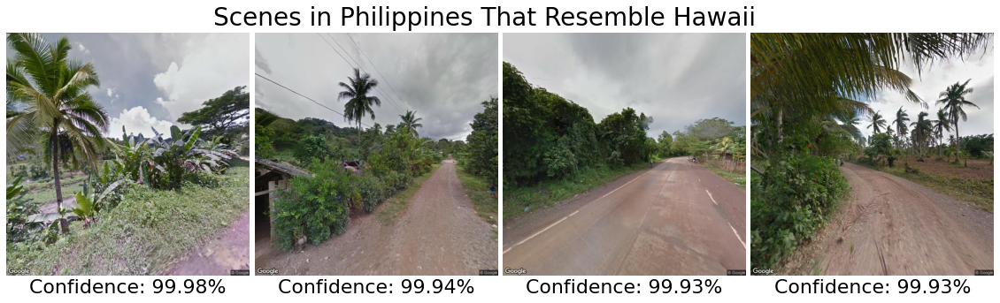

In [48]:
show_similar('Brazil', 'Hawaii')
show_similar('Uganda', 'Hawaii')
show_similar('Philippines', 'Hawaii')

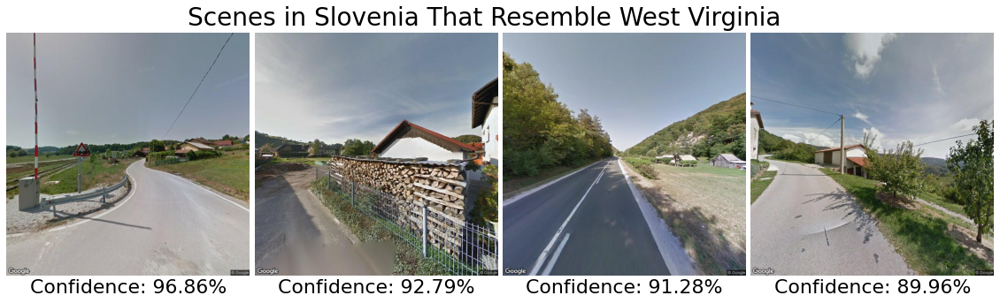

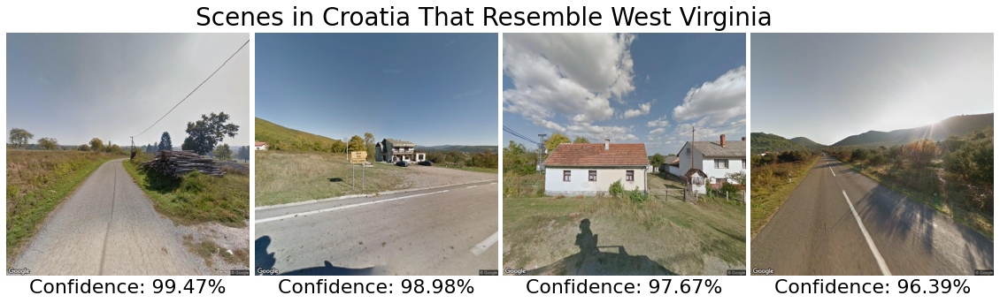

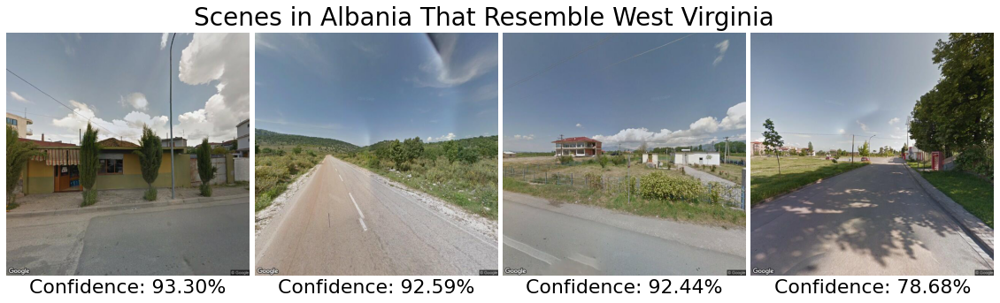

In [49]:
show_similar("Slovenia", "West Virginia")
show_similar("Croatia", "West Virginia")
show_similar("Albania", "West Virginia")

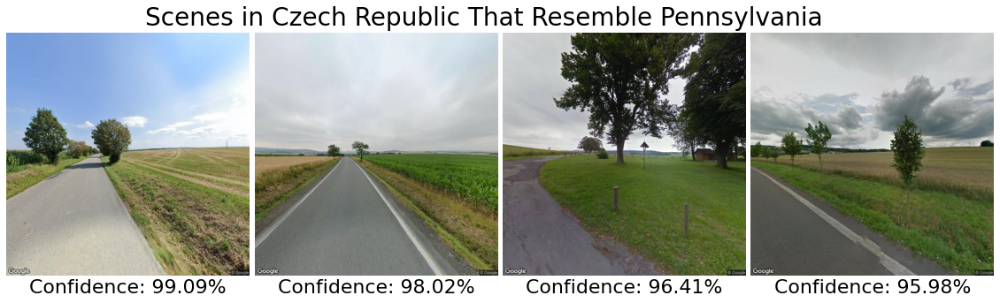

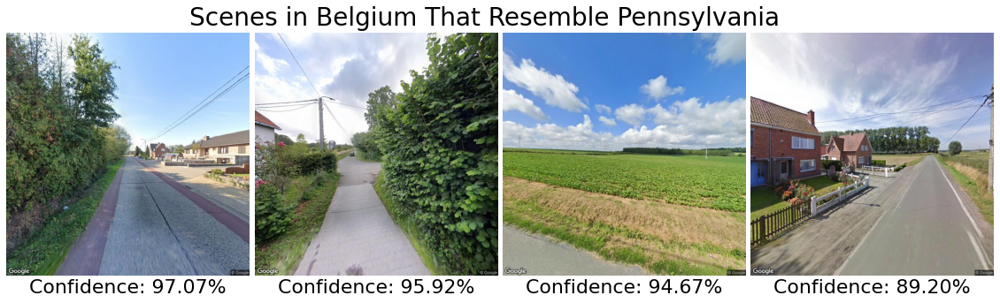

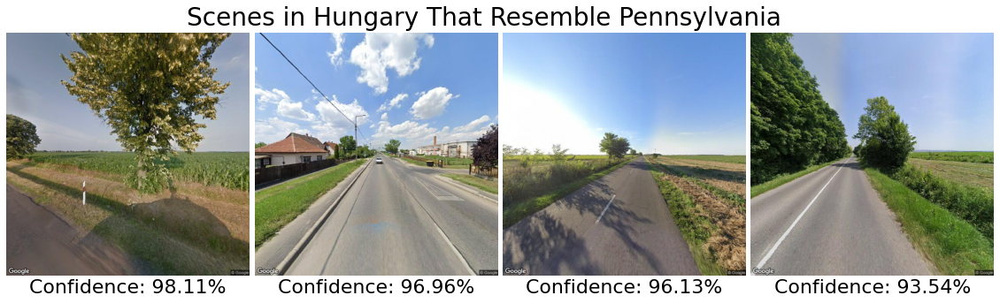

In [50]:
show_similar("Czech Republic", "Pennsylvania")
show_similar('Belgium', 'Pennsylvania')
show_similar("Hungary", "Pennsylvania")

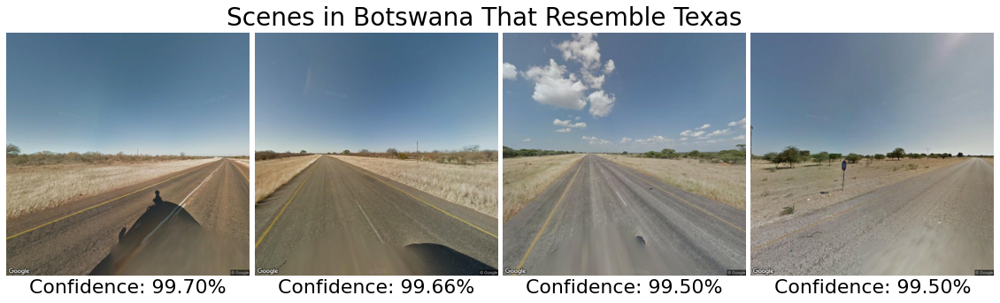

In [51]:
show_similar("Botswana", "Texas")

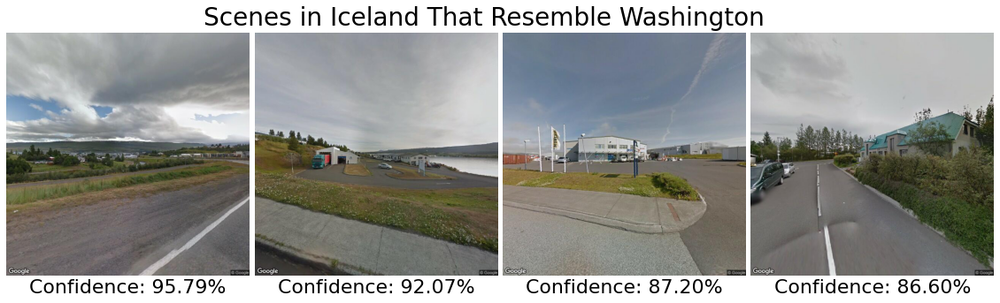

In [52]:
show_similar("Iceland", "Washington")

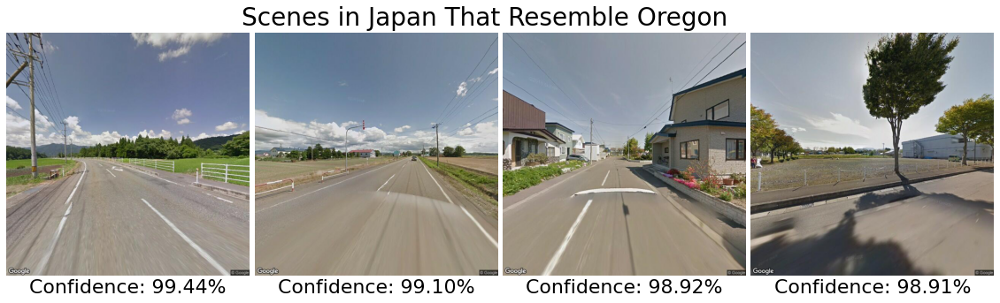

In [53]:
show_similar("Japan", "Oregon")

In [222]:
THRESH = 0.2
over_thresh = (country_to_state > THRESH)
over_thresh = country_to_state.loc[over_thresh.max(1), over_thresh.max(0)]

In [223]:
over_thresh

,Alaska,California,Hawaii,Oregon,Pennsylvania,Texas,Washington,West Virginia
Country,,,,,,,,
Albania,0.008042,0.115796,0.008239,0.024038,0.115465,0.001558,0.039506,0.229530
American Samoa,0.004252,0.034073,0.529627,0.022709,0.040719,0.027100,0.017145,0.161189
Australia,0.009893,0.190805,0.209750,0.055530,0.037769,0.058781,0.019363,0.029712
Austria,0.027512,0.026923,0.018149,0.058059,0.226952,0.013747,0.064401,0.094183
Belgium,0.043533,0.025232,0.048300,0.071684,0.215249,0.007889,0.043103,0.076816
Bhutan,0.023649,0.048242,0.110074,0.024696,0.112007,0.000352,0.030603,0.323994
Botswana,0.000198,0.096874,0.065036,0.032523,0.017797,0.280536,0.041041,0.020747
Brazil,0.003284,0.065045,0.280703,0.032409,0.095723,0.026183,0.009159,0.078416
Cambodia,0.001152,0.049103,0.256999,0.047618,0.056183,0.008598,0.015754,0.075526


In [104]:
state_to_df = {}
for state in over_thresh:
    red = over_thresh[[state]]
    state_to_df[state] = red[red[state] > THRESH]

In [105]:
state_to_df.keys()

dict_keys(['Alaska', 'California', 'Hawaii', 'Maryland', 'Pennsylvania', 'Texas', 'West Virginia'])

In [106]:
state_to_df['Alaska']

,Alaska
Country,
Finland,0.354922
Norway,0.287281


In [107]:
state_to_df['California']

,California
Country,
Australia,0.189664
Belgium,0.203732
Estonia,0.306665
Peru,0.202496


In [108]:
state_to_df['Hawaii']

,Hawaii
Country,
Australia,0.205160
Austria,0.184298
Bangladesh,0.190171
Brazil,0.274167
Faroe Islands,0.221548
Hong Kong,0.335377
Ireland,0.232935
Latvia,0.189018
Portugal,0.192876


In [109]:
state_to_df['Maryland']

,Maryland
Country,
Serbia,0.180904


In [110]:
state_to_df['Pennsylvania']

,Pennsylvania
Country,
American Samoa,0.230864
China,0.261416
France,0.182518
Germany,0.192947
Guatemala,0.187521
Lithuania,0.194886
Netherlands,0.195298
Poland,0.230085
Senegal,0.278514


In [111]:
state_to_df['Texas']

,Texas
Country,
Egypt,0.326837


In [112]:
state_to_df['West Virginia']

,West Virginia
Country,
Hungary,0.190866
Jordan,0.316195
Switzerland,0.201207
